In [1]:
from __future__ import absolute_import
from __future__ import division
from __future__ import print_function

import os
import sys
import os
import sys

import numpy as np
import tensorflow as tf
import pandas as pd
from glob import glob
import matplotlib.pyplot as plt

import skimage
import skimage.io
%matplotlib inline

print('sys_version', sys.version.replace('\n', ''))
print('virtual_env', os.environ.get('VIRTUAL_ENV', 'None'))
print('pwd', os.getcwd())
print('np ', np.__version__)
print('tf ', tf.__version__)

# fix import src problem
sys.path.append('..')

sys_version 3.5.2 (default, Nov 17 2016, 17:05:23) [GCC 5.4.0 20160609]
virtual_env None
pwd /home/marko/Projects/mozgalo2017/notebooks
np  1.11.1
tf  0.10.0


# Mozgalo

## Definitions

In [2]:
from src.modules.nn_utils import *
from src.modules.utils import *
from src.modules.dataset import *


DATASET_ROOT = '../dataset/mozgalo_dataset/extracted/'
csv_path = '../dataset/mozgalo_dataset/features.csv'
pickled_features_path = '../dataset/mozgalo_dataset/features_pickle'
init_logging()

In [3]:
# Loading dataset
dataset = ImageDataset(DATASET_ROOT)

# force only subset
#dataset.paths = dataset.paths[:60]
dataset.load_imgs()


2017-04-02 22:38:45 DEBUG    Loading imgs in dataset


100%|██████████| 6889/6889 [00:03<00:00, 2024.44it/s]


## Feature extraction

In [4]:
# Loading network
model = InceptionNet()
model.create_graph()

/usr/local/lib/python3.5/dist-packages/tensorflow/python/ops/array_ops.py:1750: VisibleDeprecationWarning: converting an array with ndim > 0 to an index will result in an error in the future
  result_shape.insert(dim, 1)


### Extracting features and dumping to file

In [20]:
# slow on cpu: cca 1-2h for 7k images
# TODO: speedup: load in batches
dataset.extract_features(model)
dataset.store_csv_features(csv_path)
dataset.store_features(pickled_features_path)

100%|██████████| 6889/6889 [1:07:31<00:00,  1.83it/s]


### Load preextracted features from last run

In [5]:
dataset.load_features(pickled_features_path)

# Data stored in dataset object

(2048,) ../dataset/mozgalo_dataset/extracted/6698.jpg


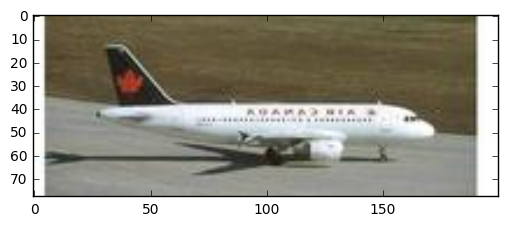

In [6]:
print(dataset.features[0].shape, dataset.paths[0])
plt.imshow(bgr_to_rgb(dataset.imgs[0]))

### Example to get labels

In [10]:
probas = model.get_probas(dataset.paths)
labels = model.get_labels(probas)

100%|██████████| 60/60 [00:17<00:00,  4.23it/s]


/usr/local/lib/python3.5/dist-packages/matplotlib/pyplot.py:524: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  max_open_warning, RuntimeWarning)


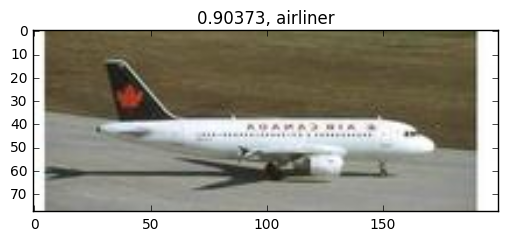

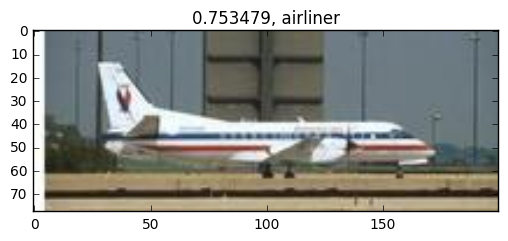

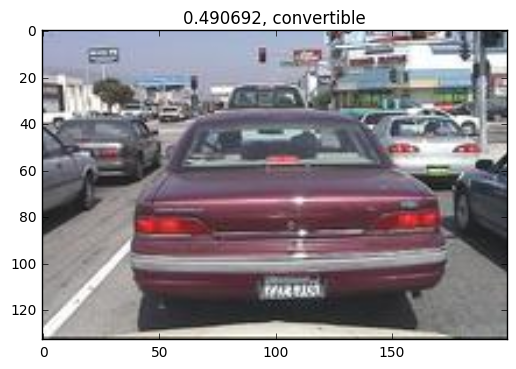

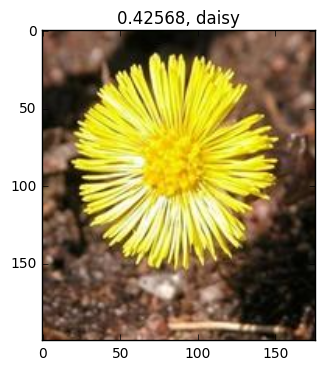

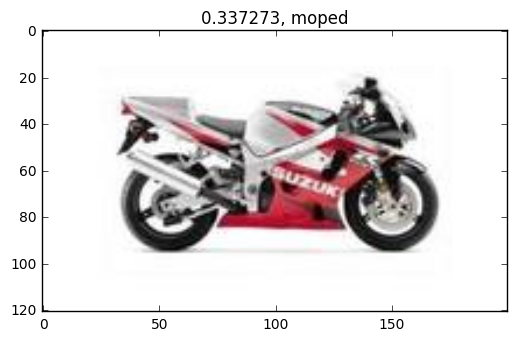

...

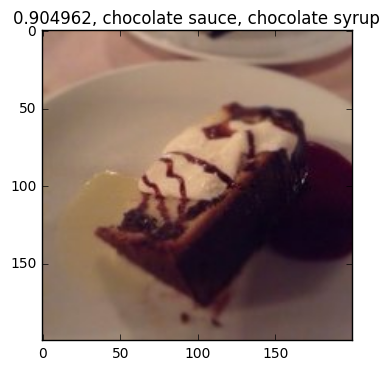

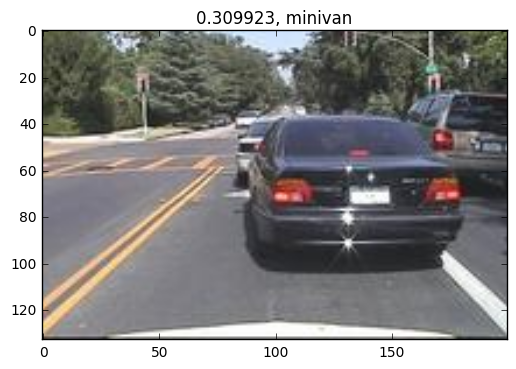

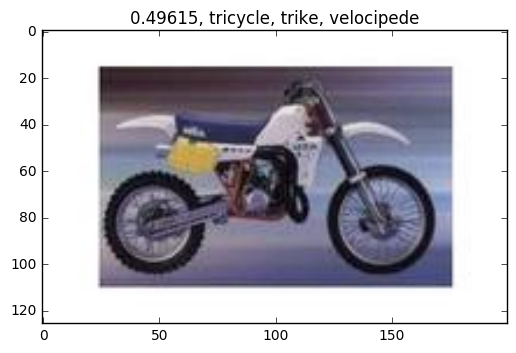

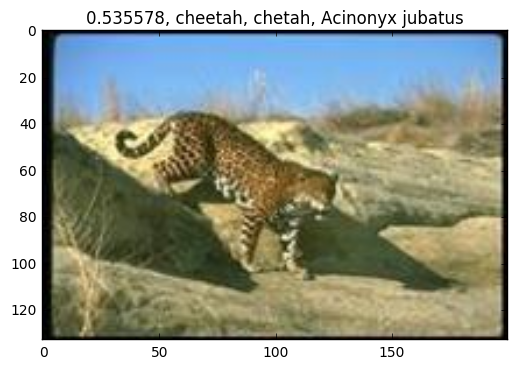

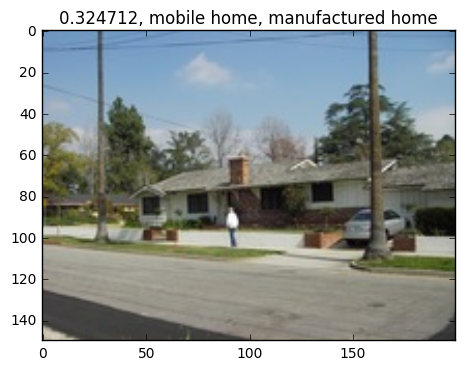

In [12]:
for i, p in enumerate(dataset.paths):
    plt.figure()
    plt.title("%s, %s" % (probas[i].max(), labels[i]))
    plt.imshow(to_rgb(dataset.imgs[i]))

### Dummy visualisation examples

In [23]:
# Downloaded from 
# https://gist.github.com/lukemetz/be6123c7ee3b366e333a
#from tsne import bh_sne
import numpy as np
from skimage.transform import resize
from sklearn.manifold import TSNE
from matplotlib import pyplot as plt

def gray_to_color(img):
    if len(img.shape) == 2:
        img = np.dstack((img, img, img))
    return img

def min_resize(img, size):
    """
    Resize an image so that it is size along the minimum spatial dimension.
    """
    w, h = map(float, img.shape[:2])
    if min([w, h]) != size:
        if w <= h:
            img = resize(img, (int(round((h/w)*size)), int(size)))
        else:
            img = resize(img, (int(size), int(round((w/h)*size))))
    return img

def image_scatter(features, images, img_res, res=4000, cval=1.):
    """
    Embeds images via tsne into a scatter plot.
    Parameters
    ---------
    features: numpy array
        Features to visualize
    images: list or numpy array
        Corresponding images to features. Expects float images from (0,1).
    img_res: float or int
        Resolution to embed images at
    res: float or int
        Size of embedding image in pixels
    cval: float or numpy array
        Background color value
    Returns
    ------
    canvas: numpy array
        Image of visualization
    """
    features = np.copy(features).astype('float64')
    images = [gray_to_color(image) for image in images]
    images = [min_resize(image, img_res) for image in images]
    max_width = max([image.shape[0] for image in images])
    max_height = max([image.shape[1] for image in images])

    #f2d = bh_sne(features)
    model = TSNE(n_components=2, random_state=0)
    f2d = model.fit_transform(features) 

    xx = f2d[:, 0]
    yy = f2d[:, 1]
    x_min, x_max = xx.min(), xx.max()
    y_min, y_max = yy.min(), yy.max()
    # Fix the ratios
    sx = (x_max-x_min)
    sy = (y_max-y_min)
    if sx > sy:
        res_x = sx/float(sy)*res
        res_y = res
    else:
        res_x = res
        res_y = sy/float(sx)*res

    canvas = np.ones((res_x+max_width, res_y+max_height, 3))*cval
    x_coords = np.linspace(x_min, x_max, res_x)
    y_coords = np.linspace(y_min, y_max, res_y)
    for x, y, image in zip(xx, yy, images):
        w, h = image.shape[:2]
        x_idx = np.argmin((x - x_coords)**2)
        y_idx = np.argmin((y - y_coords)**2)
        # bgr to rgb
        canvas[x_idx:x_idx+w, y_idx:y_idx+h] = image[:,:, [2, 1, 0]]
    
    return canvas

In [26]:
canvas = image_scatter(dataset.features[:50], dataset.imgs[:50], 80, res=1000)

/usr/local/lib/python3.5/dist-packages/numpy/core/numeric.py:190: VisibleDeprecationWarning: using a non-integer number instead of an integer will result in an error in the future
  a = empty(shape, dtype, order)


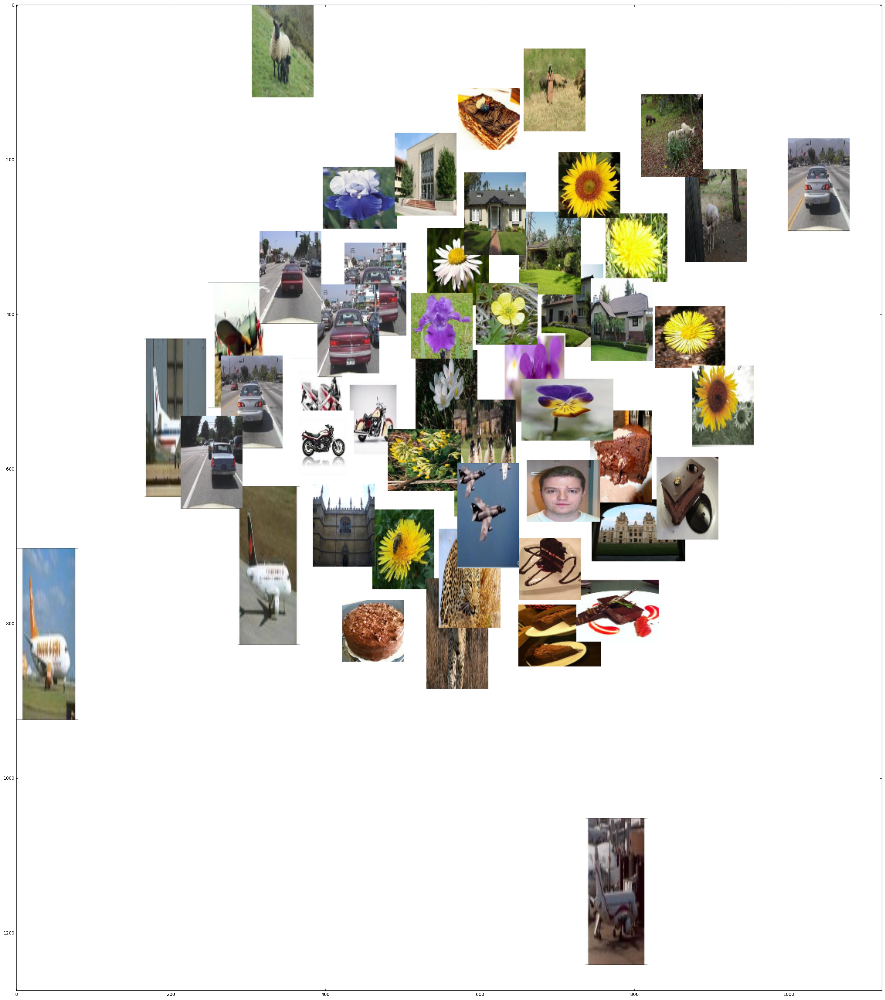

In [27]:
# ruzni prikaz, triba vodit racuna o dimenzijama
plt.figure(figsize=(40,40))
plt.imshow(canvas)